In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import scanpy as sc
import anndata as AD
# import squidpy as sq

import pickle

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

import scipy as sp
from sklearn.metrics import confusion_matrix

import importlib

In [2]:
sc.set_figure_params(vector_friendly=True, dpi_save=300) 

In [3]:
sns.set_style("whitegrid")
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

In [4]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

plt.rcParams.update({
    'pdf.fonttype': 42, 
    'ps.fonttype': 42
})

In [5]:
adata = sc.read_10x_h5(
    filename="./Data/cell_feature_matrix.h5"
)

df = pd.read_csv(
    "./Data/obs.csv",index_col=0)
df.index = df.index.astype(str)

adata = adata[df.index,]
adata.obs = df.copy()

In [6]:
adata.obs["Sample"] = 'BRCA'
adata.obs

,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,total_counts,cell_area,nucleus_area,Cluster,n_genes_by_counts,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_10_genes,pct_counts_in_top_20_genes,pct_counts_in_top_50_genes,pct_counts_in_top_150_genes,n_counts,Sample
cell_id,,,,,,,,,,,,,,,,,,
15,832.433368,363.203822,120,0,0,120.0,256.171406,167.394219,DCIS_1,63,4.158883,4.795791,35.833333,56.666667,89.166667,100.0,120.0,BRCA
57,848.923233,399.355566,115,0,0,115.0,251.384844,82.048906,DCIS_1,69,4.248495,4.753590,39.130435,56.521739,83.478261,100.0,115.0,BRCA
68,828.997104,148.561274,299,0,0,299.0,130.185469,46.420625,Invasive_Tumor,60,4.110874,5.703783,51.170569,74.247492,96.655518,100.0,299.0,BRCA
69,849.884619,311.871194,240,0,0,240.0,137.004063,36.260469,DCIS_1,56,4.043051,5.484797,61.666667,77.500000,97.500000,100.0,240.0,BRCA
72,810.034903,25.008612,127,0,0,127.0,131.675625,37.660313,Myoepi_ACTA2+,55,4.025352,4.852030,45.669291,66.141732,96.062992,100.0,127.0,BRCA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167775,7465.141602,5107.828467,374,0,0,374.0,165.949219,90.447969,DCIS_2,81,4.406719,5.926926,45.454545,66.310160,91.711230,100.0,374.0,BRCA
167776,7455.475342,5114.875415,229,1,0,229.0,220.452812,60.599688,DCIS_2,77,4.356709,5.438079,42.794760,63.318777,88.209607,100.0,229.0,BRCA
167778,7470.159424,5119.132056,397,0,0,397.0,287.058281,86.700000,DCIS_2,75,4.330733,5.986452,55.415617,73.551637,93.702771,100.0,397.0,BRCA


In [7]:
adata.obsm["spatial"] = adata.obs[["x_centroid", "y_centroid"]].copy().to_numpy()

In [8]:
spatial_net_df = pd.read_csv("./Data/LRpair_matrix_nolabel.csv",index_col=0)
spatial_net_df = spatial_net_df.apply(lambda row: 
                         (row - row.min()) / (row.max() - row.min()) 
                         if row.max() != row.min() else row, axis=1)
spatial_net_df.index = spatial_net_df.index.astype(str)

In [9]:
file = "./Results/Others/SIGMOD/topic_proportions0.csv"
theta_logit = pd.read_csv(file,index_col=0)
theta_logit.index = theta_logit.index.astype('str')
for i in range(theta_logit.shape[1]):
    adata.obs.loc[theta_logit.index,'Module'+str(i+1)] = theta_logit.iloc[:,i]

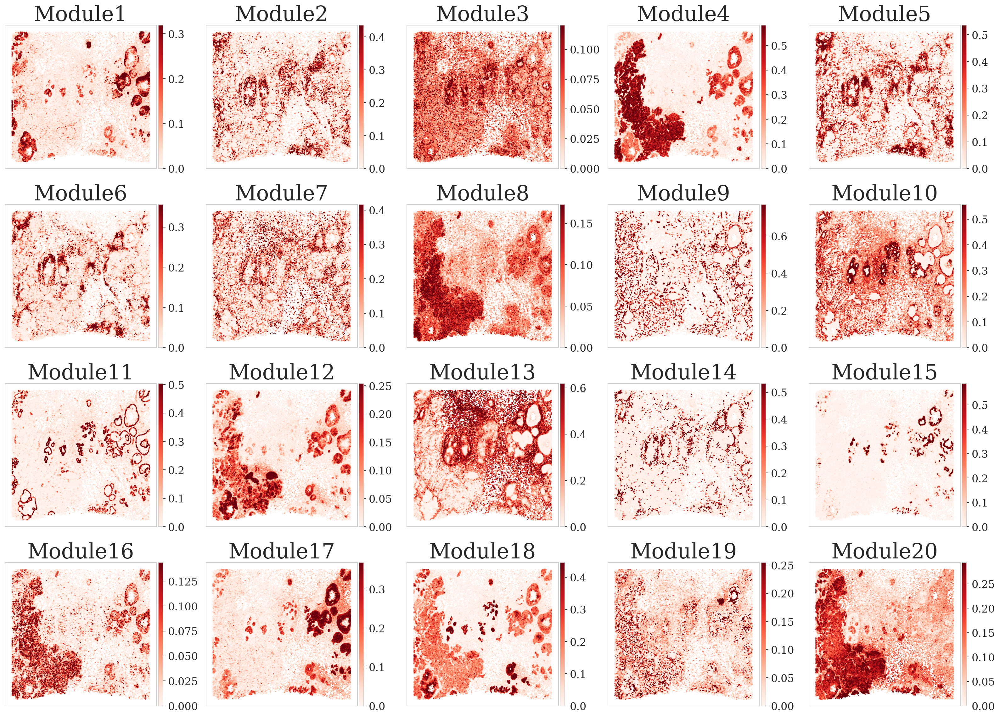

In [10]:
cellsForplot = ['Module'+str(i+1) for i in range(20)]

# Generate the plot
ax = sc.pl.embedding(
    adata,
    basis="spatial",
    show=False,
    color=cellsForplot,
    cmap="Reds",
    vmax='p99',
    size=8,
    ncols=5,
)

# Manually set rasterization for collections
for a in plt.gcf().axes:  # Traverse each axis
    if hasattr(a, 'collections'):
        for collection in a.collections:
            collection.set_rasterized(True)  # Rasterize the points to reduce file size

# # Adjust colorbar font size
for ax in plt.gcf().axes:
    if isinstance(ax, plt.Axes):
        if hasattr(ax, 'collections') and ax.collections:
            for collection in ax.collections:
                if hasattr(collection, 'colorbar') and collection.colorbar:
                    cbar = collection.colorbar
                    cbar.ax.tick_params(labelsize=15)  # Set colorbar tick font size
    ax.set_xlabel('')  # Clear x-axis label
    ax.set_ylabel('')  # Clear y-axis label

cellsForplot_with_spaces = []
for element in cellsForplot:
    cellsForplot_with_spaces.append(element)
    cellsForplot_with_spaces.append("")

for ax, title in zip(plt.gcf().axes, cellsForplot_with_spaces):
    if isinstance(ax, plt.Axes):
        ax.set_title(title, fontsize=30)

# ax.invert_yaxis()
# ax.set_aspect("equal")

plt.tight_layout()  # Adjust layout to fit titles properly
plt.savefig('./Figures/4_All_module.pdf', dpi=300, bbox_inches='tight')
plt.show()

In [11]:
topics = ['Module'+str(i+1) for i in range(20)]

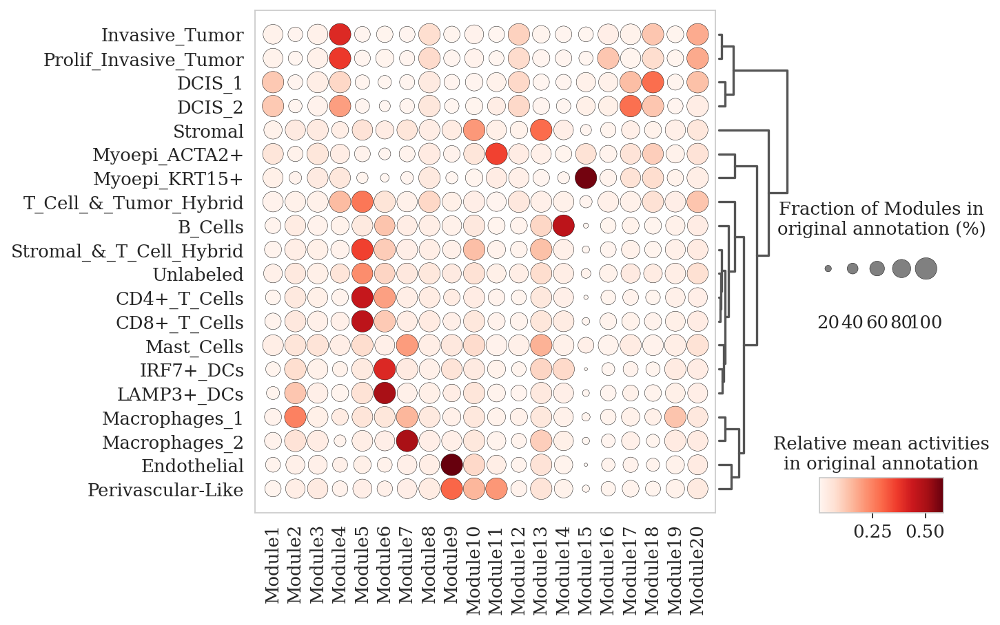

In [39]:
with plt.rc_context({'figure.figsize':(8,6)}):
    sc.pl.dotplot(adata,topics, groupby='Cluster', 
                  dendrogram=True,
                  size_title = "Fraction of Modules in\noriginal annotation (%)",
                  colorbar_title = "Relative mean activities\nin original annotation",
                  show=False,
                  figsize=(8,6)
              )
    plt.savefig("Figures/5_module_prop_dotplot.pdf",bbox_inches = "tight")

In [12]:
adata.obs["SIGMOD"] = adata.obs[['Module'+str(i+1) for i in range(20)]].idxmax(axis=1)

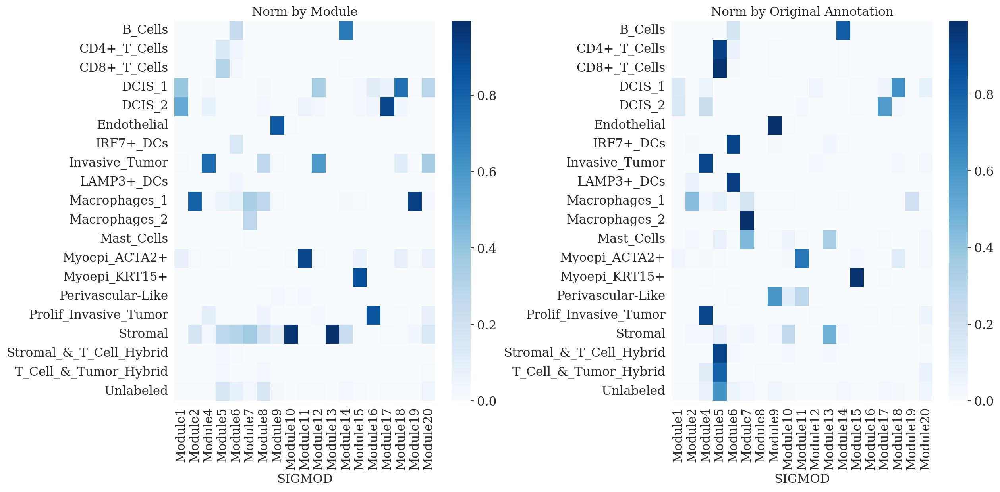

In [23]:
cellsForplot = ['Module'+str(i) for i in [1,2,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]]

conf_matrix1 = pd.crosstab(adata.obs['Cluster'], adata.obs['SIGMOD'])
conf_matrix1 = conf_matrix1.div(conf_matrix1.sum(axis=0), axis=1)

conf_matrix2 = pd.crosstab(adata.obs['Cluster'], adata.obs['SIGMOD'])
conf_matrix2 = conf_matrix2.div(conf_matrix2.sum(axis=1), axis=0)

fig, axes = plt.subplots(1, 2, figsize=(16, 8)) 

sns.heatmap(conf_matrix1[cellsForplot], annot=False, 
            fmt='.2f', cmap='Blues', ax=axes[0])
axes[0].set_title('Norm by Module')
axes[0].set_ylabel('')

sns.heatmap(conf_matrix2[cellsForplot], annot=False, 
            fmt='.2f', cmap='Blues', ax=axes[1])
axes[1].set_title('Norm by Original Annotation')
axes[1].set_ylabel('')

plt.tight_layout()
plt.savefig("./Figures/5_2_ConfusionMatrix_0214.pdf")
plt.show()

In [10]:
sigmod_beta = pd.read_csv("./Results/Others/SIGMOD/topicWords_softmax0.csv",index_col=0)
sigmod_beta = sigmod_beta.T
sigmod_beta.columns = ['Module'+str(i+1) for i in range(20)]

In [10]:
genes = ["BANK1","GZMB","TCF4","LPXN","CCL5","SLAMF1","IL2RG","CCR7","FGL2","LYZ",
        "MRC1","ZEB1","CD69","LPL","VWF","EGFL7","TCEAL7","LRRC15","SDC4","CCPG1",
        "DAPK3","OCIAD2","NPM3","CTTN","FASN","SQLE","VOPP1","RUNX1","SERPINA3",
        "EDN1","MYBPC1","TUBB2B","PIM1","MMP1"]

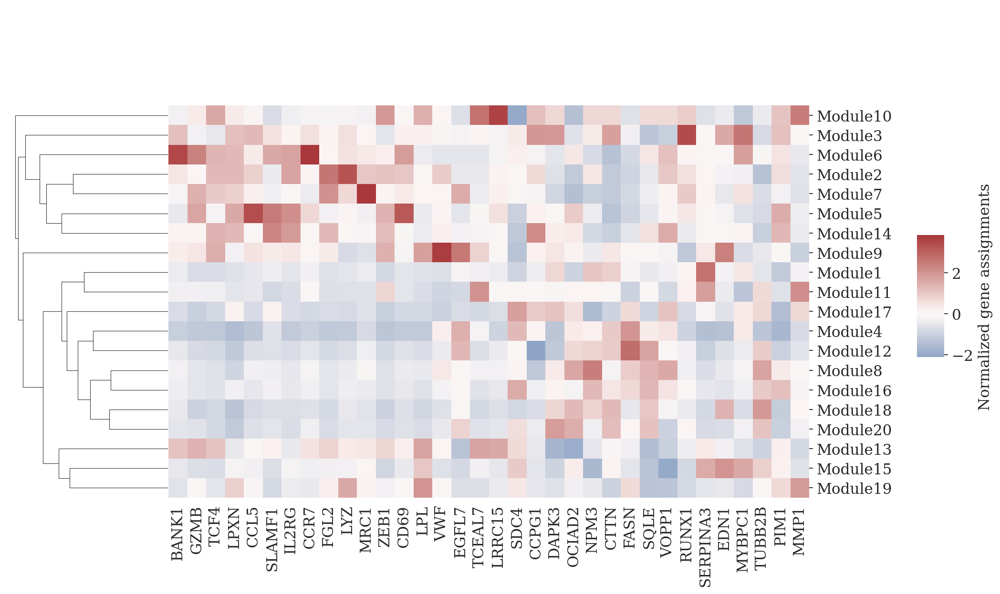

In [23]:
# draw a clustered heatmap (rows & columns clustered)
cg = sns.clustermap(
    sigmod_beta.T.loc[:,genes],
    cmap="vlag",
    center=0,
    z_score=1,
    row_cluster=True,
    col_cluster=False,
    figsize=(12, 8),
    cbar_kws={'label': 'Normalized gene assignments'}
)

cg.cax.set_position([1.01, 0.40, 0.03, 0.20])

plt.show()

cg.fig.savefig(
    "./Figures/6_1_raw_celltype_markers.pdf",
    format='pdf',
    bbox_inches='tight'
)

### ### Marker gene for each module

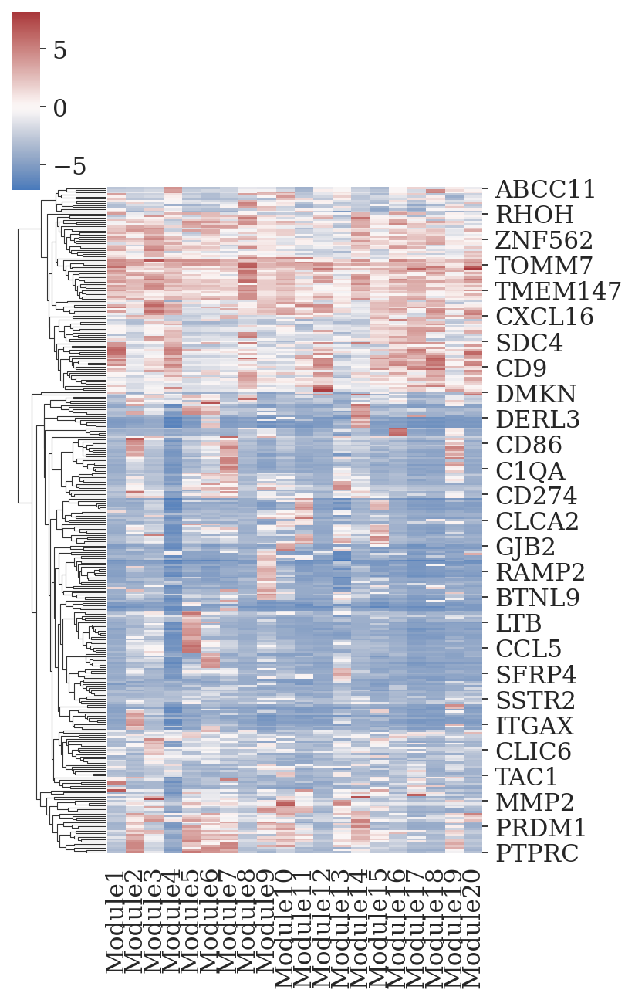

In [47]:
g = sns.clustermap(sigmod_beta,col_cluster=False,row_cluster=True,cmap="vlag", center=0)
g.fig.set_size_inches(4.5, 8)
plt.show()

In [19]:
top_n_values = {}
genes = []
for col in sigmod_beta.columns:
    top_n = sigmod_beta[col].nlargest(3)
    top_n_values[col] = {'values': top_n.values, 'indices': top_n.index}
    genes.extend(list(top_n.index))

In [32]:
genes = list(set(genes))
print(len(genes))

48


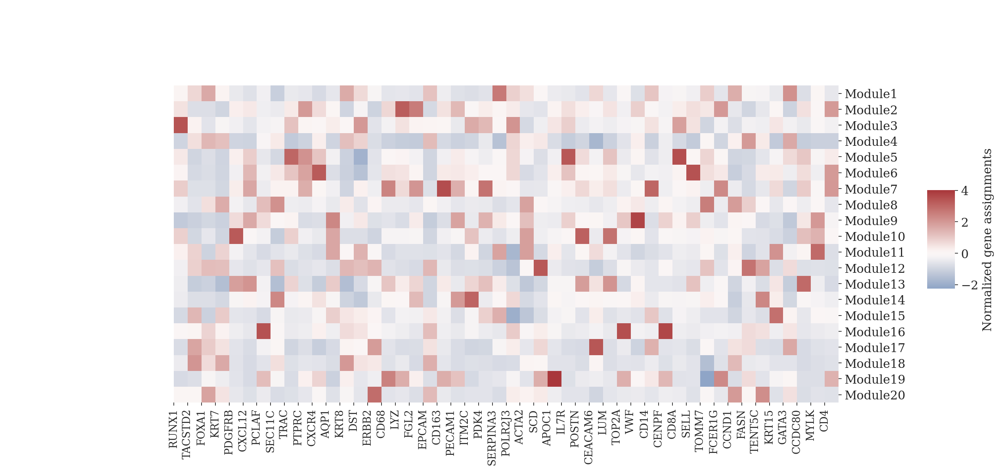

In [33]:
cg = sns.clustermap(
    sigmod_beta.T.loc[:,genes],
    cmap="vlag",
    center=0,
    z_score=1,
    row_cluster=False,
    col_cluster=False,
    figsize=(15, 8),
    cbar_kws={'label': 'Normalized gene assignments'}
)

cg.cax.set_position([1.01, 0.40, 0.03, 0.20])
cg.ax_heatmap.set_xticks(np.arange(len(genes)))
cg.ax_heatmap.set_xticklabels(genes, rotation=90, fontsize=12)
cg.ax_heatmap.tick_params(axis='x', bottom=True, top=False, labelbottom=True)

plt.show()

cg.fig.savefig(
    "./Figures/6_2_module_markers.pdf",
    format='pdf',
    bbox_inches='tight'
)

In [11]:
genes = ["PCLAF", "TOP2A", "CENPF", "MKI67","TCIM","FASN","CEACAM6"]

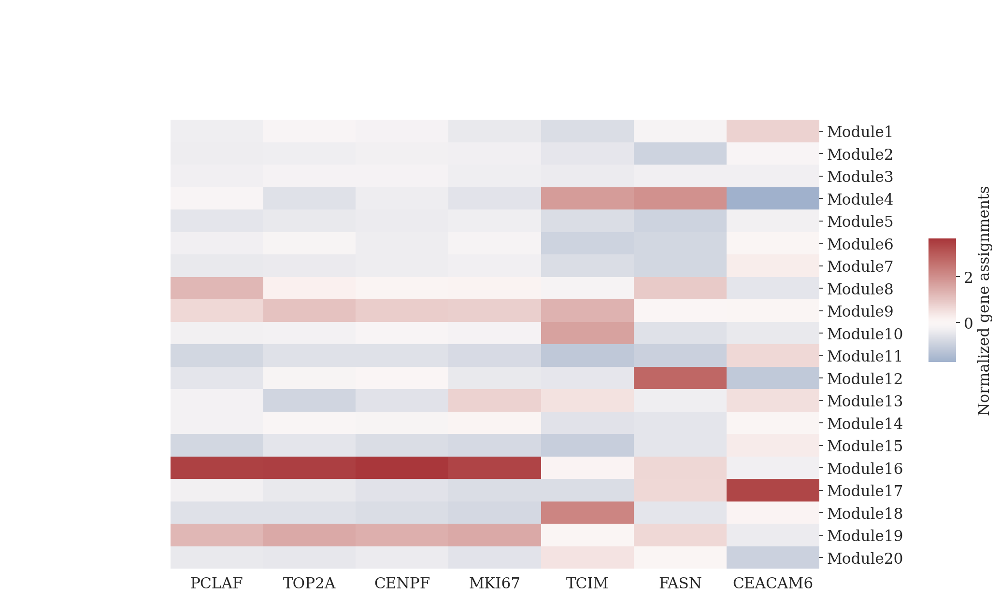

In [12]:
cg = sns.clustermap(
    sigmod_beta.T.loc[:,genes],
    cmap="vlag",
    center=0,
    z_score=1,
    row_cluster=False,
    col_cluster=False,
    figsize=(12, 8),
    cbar_kws={'label': 'Normalized gene assignments'}
)

cg.cax.set_position([1.01, 0.40, 0.03, 0.20])

plt.show()

# cg.fig.savefig(
#     "./Figures/6_2_module_markers.pdf",
#     format='pdf',
#     bbox_inches='tight'
# )

## Functional annotaion of each module

In [52]:
import gseapy as gp

In [69]:
gene_sets = 'MSigDB_Hallmark_2020'

gsea_results = {}

for module in sigmod_beta.columns:
    gene_scores = sigmod_beta[module]
    gene_scores = gene_scores.dropna().sort_values(ascending=False)
    rnk = gene_scores.reset_index()
    rnk.columns = ['gene_name', 'score']
    pre_res = gp.prerank(rnk=rnk, gene_sets=gene_sets, processes=4, permutation_num=1000,min_size=1,
                         outdir=None, seed=42, verbose=False)
    
    gsea_results[module] = pre_res.res2d
    gsea_results[module]["Module"] = module

In [100]:
gsea_results_df = pd.concat(gsea_results)

In [101]:
gsea_results_df = gsea_results_df[gsea_results_df["NOM p-val"]<1e-1]
gsea_results_df_NES = pd.pivot(gsea_results_df,columns="Term",index="Module",values="NES")
gsea_results_df_NES = gsea_results_df_NES.fillna(0)
gsea_results_df_p = pd.pivot(gsea_results_df,columns="Term",index="Module",values="NOM p-val")
gsea_results_df_p = gsea_results_df_p.fillna(1)

In [102]:
gsea_results_df_NES = gsea_results_df_NES.loc[["Module" + str(i+1) for i in range(20)],].T
gsea_results_df_p = gsea_results_df_p.loc[["Module" + str(i+1) for i in range(20)],].T

In [103]:
conditions = [
    gsea_results_df_p < 1e-3,
    gsea_results_df_p < 1e-2,
    gsea_results_df_p < 5e-2,
    gsea_results_df_p < 1e-1,
    gsea_results_df_p > 1e-1,
]
choices = [3,2, 1.5, 1, 0]

gsea_results_df_p_dis = pd.DataFrame(
    np.select(conditions, choices, default=np.nan),
    index=gsea_results_df_p.index,
    columns=gsea_results_df_p.columns
)

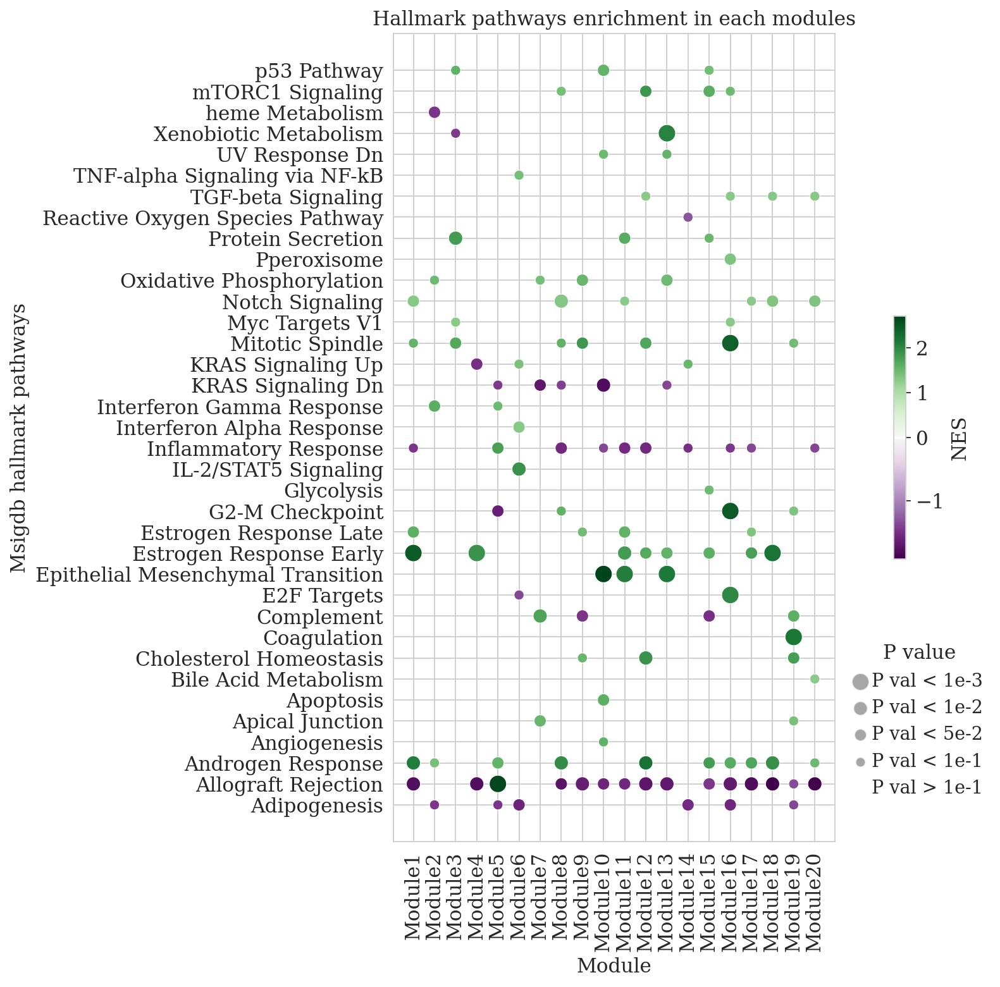

In [106]:
plt.figure(figsize=(10, 10))
group2_names = gsea_results_df_p.index
group1_names = gsea_results_df_p.columns

x, y = np.meshgrid(group1_names, group2_names)

x = x.flatten()
y = y.flatten()
exp_values = gsea_results_df_NES.values.flatten()
percent_values = gsea_results_df_p_dis.values.flatten()


### set color midpoint = 0
# Create a custom colormap based on PRGn, with 0 mapped to white
cmap = plt.cm.PRGn  # Get the original PRGn colormap
colors = cmap(np.linspace(0, 1, 256))  # Get the colormap's colors
# Modify the color at the midpoint (0) to white
midpoint = 128  # Assuming 256 colors, midpoint is around 128
colors[midpoint-1:midpoint+1] = [1, 1, 1, 1]  # Set to white (RGBA)
# Create a new colormap
custom_cmap = mcolors.LinearSegmentedColormap.from_list('custom_PRGn', colors)
# Normalize the data to map to the colormap, ensuring 0 is at the midpoint
norm = mcolors.TwoSlopeNorm(vmin=exp_values.min(), vcenter=0, vmax=exp_values.max())
#### 

scatter = plt.scatter(x, y, c=exp_values, s=percent_values*50, cmap=custom_cmap,norm=norm,
                       alpha=1, edgecolors="w", linewidth=0.5)

plt.colorbar(scatter, label='NES',pad=0.1,shrink=0.3)

legend_sizes = [3,2,1.5,1,0]
legend_sizes_scaled = [size * 50 for size in legend_sizes]
legend_labels = ["P val < 1e-3",
                 "P val < 1e-2",
                 "P val < 5e-2",
                 "P val < 1e-1",
                 "P val > 1e-1",]

for size, scaled_size, label in zip(legend_sizes, legend_sizes_scaled, legend_labels):
    plt.scatter([], [], s=scaled_size, c='gray', alpha=0.7, edgecolors="w", label=label)

plt.legend(title='P value', loc='center left', bbox_to_anchor=(1.01, 0.15), frameon=False)

plt.xlabel('Module')
plt.ylabel('Msigdb hallmark pathways')
plt.title('Hallmark pathways enrichment in each modules')

plt.xticks(np.arange(len(group1_names)), group1_names, rotation=90)
plt.yticks(np.arange(len(group2_names)), group2_names)

plt.tight_layout()
plt.savefig("Figures/7_Module_Functional_Annotation.pdf",dpi=300)
plt.show()

In [ ]:
### Spatial Correlation Analysis

In [ ]:
from SIGMOD import SIGMOD_CCI as cci

In [113]:
def compute_correlations(theta_logit, spatialnet_df):

    tmp_sub = spatialnet_df[
        (spatialnet_df['Cell1'].isin(theta_logit.index)) &
        (spatialnet_df['Cell2'].isin(theta_logit.index))
    ]
    if not tmp_sub.empty:
        # Merge the topic distributions of two cells
        theta1_sub = theta_logit.loc[tmp_sub['Cell1']].reset_index(drop=True)
        theta1_sub['cell'] = tmp_sub['Cell1'].values
        theta1_sub = theta1_sub.groupby('cell').sum().reset_index()
        
        theta2_sub = theta_logit.loc[tmp_sub['Cell2']].reset_index(drop=True)
        theta2_sub['cell'] = tmp_sub['Cell1'].values
        theta2_sub = theta2_sub.groupby('cell').sum().reset_index()
        
        tmp_cor = pd.concat([theta1_sub.drop(columns=['cell']), 
                             theta2_sub.drop(columns=['cell'])], 
                            axis=1)
        # tmp_cor['cell'] = tmp_sub['Cell1'].values
        # tmp_cor = tmp_cor.groupby('cell').sum().reset_index()
        # cor_matrix = tmp_cor.drop(columns=['cell']).corr(method='pearson')
        cor_matrix = tmp_cor.corr(method='pearson')
        # cor_matrix = cor_matrix.where(cor_matrix >= 0.6, 0)
        ncol1 = theta_logit.shape[1]
        cor_matrix = cor_matrix.iloc[:ncol1, ncol1:]
        return cor_matrix
    else:
        return None

In [114]:
file = "./Results/Others/SIGMOD/topic_proportions0.csv"
theta_logit = pd.read_csv(file,index_col=0)
theta_logit.index = theta_logit.index.astype('str')
theta_logit.columns = ["Module" + str(i+1) for i in range(20)]

In [115]:
spatial_net = pd.read_csv("./Data/spatial_net.csv",index_col=0)
spatial_net.index = spatial_net.index.astype(str)
spatial_net.Cell1 = spatial_net.Cell1.astype(str)
spatial_net.Cell2 = spatial_net.Cell2.astype(str)

In [151]:
sigmod_beta = pd.read_csv("./Results/Others/SIGMOD/topicWords_softmax0.csv",index_col=0)
sigmod_beta = sigmod_beta.T
sigmod_beta.columns = ['Module'+str(i+1) for i in range(20)]

In [153]:
cor_mat = compute_correlations(theta_logit,spatial_net)

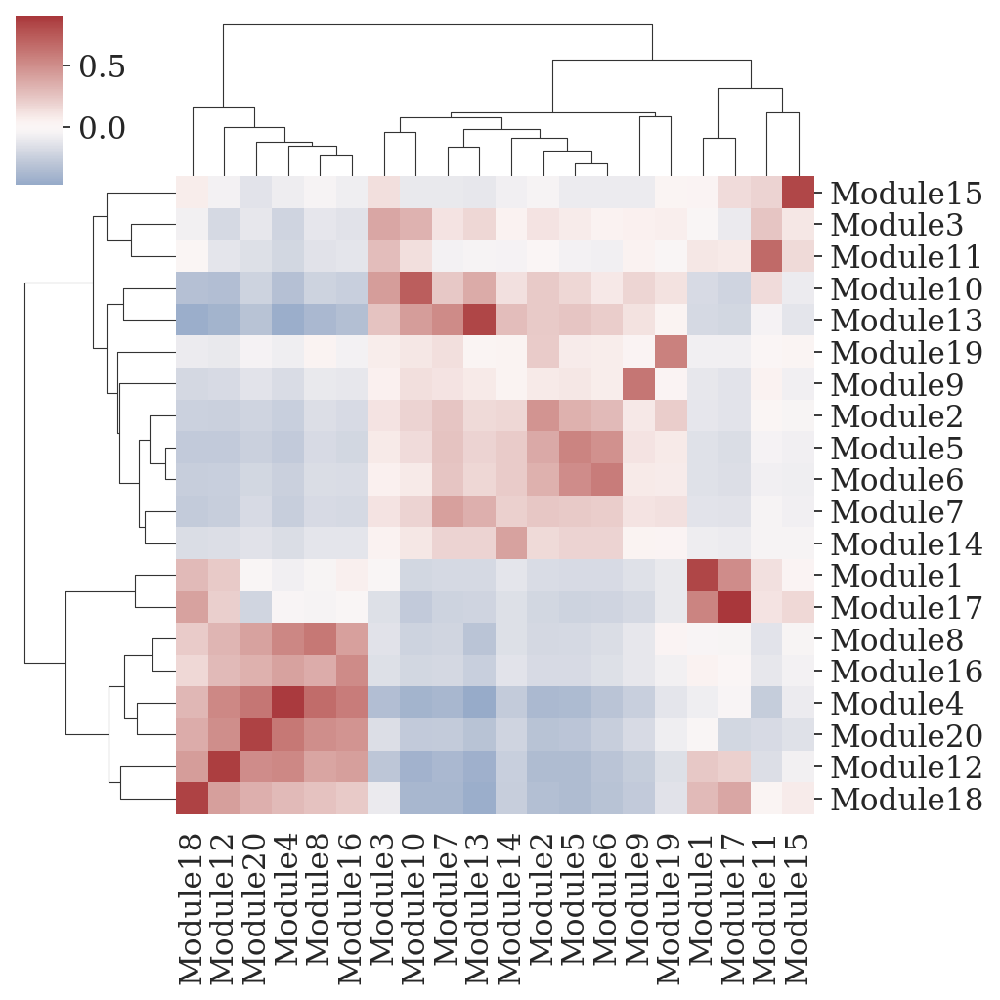

In [118]:
g = sns.clustermap(cor_mat,cmap="vlag",center=0)
g.fig.set_size_inches(6, 6)
plt.savefig("./Figures/7_2_module_correlation.pdf", dpi=300, bbox_inches='tight')
plt.show()

In [119]:
eta = pd.read_csv("./Results/Others/SIGMOD/eta0.csv",index_col=0)
eta.columns = ["Module" + str(i+1) for i in range(20)]
eta.index = ['CEACAM6_EGFR', 'MMP2_PECAM1', 'CDH1_EGFR', 'CXCL12_CXCR4', 'CXCL12_CD4', 'S100A8_CD69', 'C1QA_CD93', 
             'S100A8_CD68', 'CD274_CD80', 'S100A4_ERBB2', 'S100A4_EGFR', 'CXCL12_AVPR1A', 'CD86_CTLA4', 'PDCD1LG2_PDCD1', 
             'CD274_PDCD1', 'CXCL12_SDC4', 'CCL5_SDC4', 'EDN1_EDNRB']

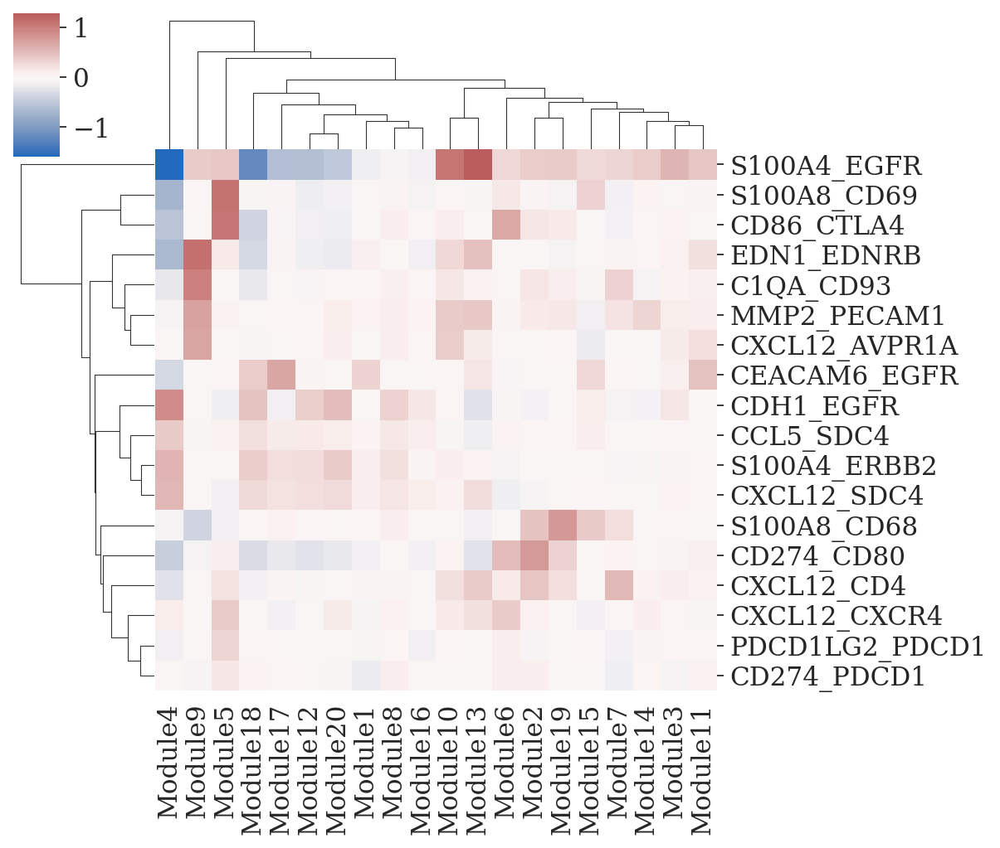

In [123]:
g = sns.clustermap(eta,cmap="vlag",center = 0)
g.fig.set_size_inches(7, 6)
plt.savefig("./Figures/8_1_niche_effect.pdf", dpi=300, bbox_inches='tight')
plt.show()

In [152]:
genes =[i.split("_",1)[0] for i in eta.index]
genes.extend([i.split("_",1)[1] for i in eta.index])
genes = list(set(genes))

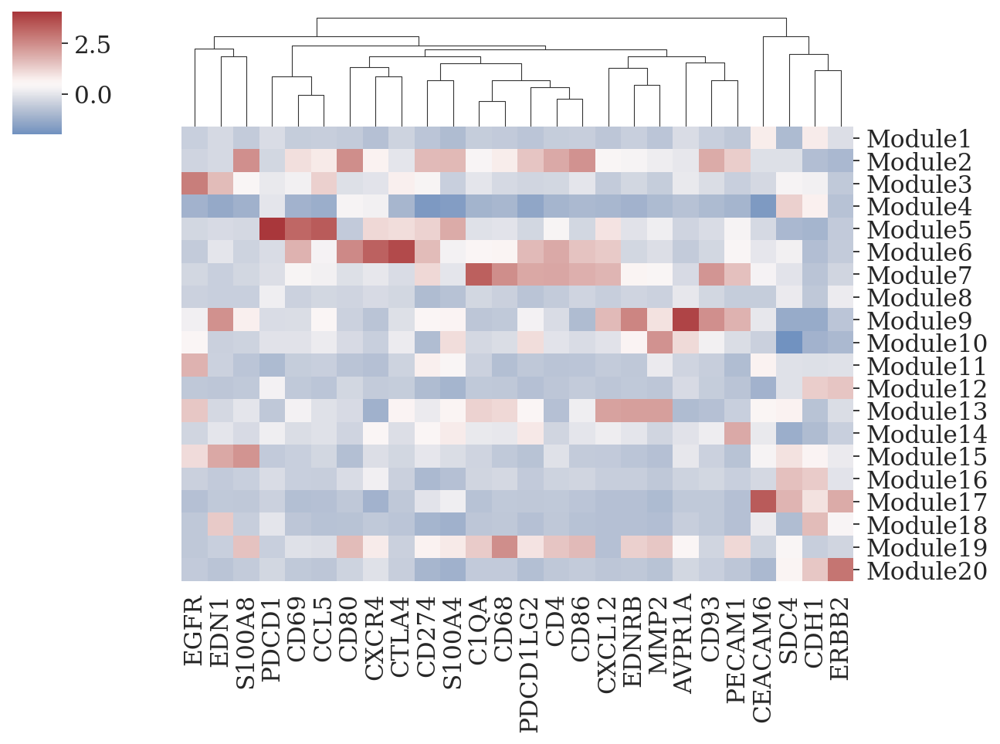

In [129]:
g = sns.clustermap(sigmod_beta.T.loc[:,genes],
                   col_cluster=True,row_cluster=False,
                   cmap="vlag", center=0.5,
                   z_score=1)
g.fig.set_size_inches(8, 5.5)
plt.savefig("./Figures/8_2_LR_in_Niche_0214.pdf", dpi=300, bbox_inches='tight')
plt.show()

In [154]:
cor_mat_array = np.array(cor_mat.T)
cor_mat_array[cor_mat_array<0] = 0
C_broadcast = cor_mat_array[:, :, np.newaxis]

In [163]:
genes =[i.split("_",1)[0] for i in eta.index]
sigmod_beta_array = np.array(sigmod_beta.T.loc[:,genes])
sigmod_beta_array[sigmod_beta_array<0] = 0
A_broadcast = sigmod_beta_array[:,np.newaxis, :]

In [156]:
eta_array = np.array(eta.T)
B_broadcast = eta_array[np.newaxis,:,:]  

In [164]:
print(C_broadcast.shape,A_broadcast.shape,B_broadcast.shape)
Influence = C_broadcast * A_broadcast * B_broadcast  # n x L x R
Influence = np.transpose(Influence, (2, 0, 1))

(20, 20, 1) (20, 1, 18) (1, 20, 18)


In [165]:
print(genes)
print(eta.index)

['CEACAM6', 'MMP2', 'CDH1', 'CXCL12', 'CXCL12', 'S100A8', 'C1QA', 'S100A8', 'CD274', 'S100A4', 'S100A4', 'CXCL12', 'CD86', 'PDCD1LG2', 'CD274', 'CXCL12', 'CCL5', 'EDN1']
Index(['CEACAM6_EGFR', 'MMP2_PECAM1', 'CDH1_EGFR', 'CXCL12_CXCR4',
       'CXCL12_CD4', 'S100A8_CD69', 'C1QA_CD93', 'S100A8_CD68', 'CD274_CD80',
       'S100A4_ERBB2', 'S100A4_EGFR', 'CXCL12_AVPR1A', 'CD86_CTLA4',
       'PDCD1LG2_PDCD1', 'CD274_PDCD1', 'CXCL12_SDC4', 'CCL5_SDC4',
       'EDN1_EDNRB'],
      dtype='object')


In [166]:
total_influence = Influence.sum(axis=0)
total_influence_df = pd.DataFrame(total_influence,
                              columns = ["Module"+str(i+1) for i in range(20)],
                              index = ["Module"+str(i+1) for i in range(20)])

In [ ]:
from SIGMOD import SIGMOD_plot as sigmod_plot

In [140]:
colors = ["#FFD92F","#4DAF4A","#FCCDE5","#D9D9D9","#377EB8","#7FC97F","#BEAED4",
           "#FDC086","#FFFF99","#386CB0","#F0027F","#BF5B17","#666666","#1B9E77","#D95F02",
           "#7570B3","#E7298A","#66A61E","#E6AB02","#A6761D"]
celltypes = total_influence_df.columns

In [142]:
node_color_map = {}
for celltype, color in zip(celltypes,colors):
    node_color_map[celltype] = color

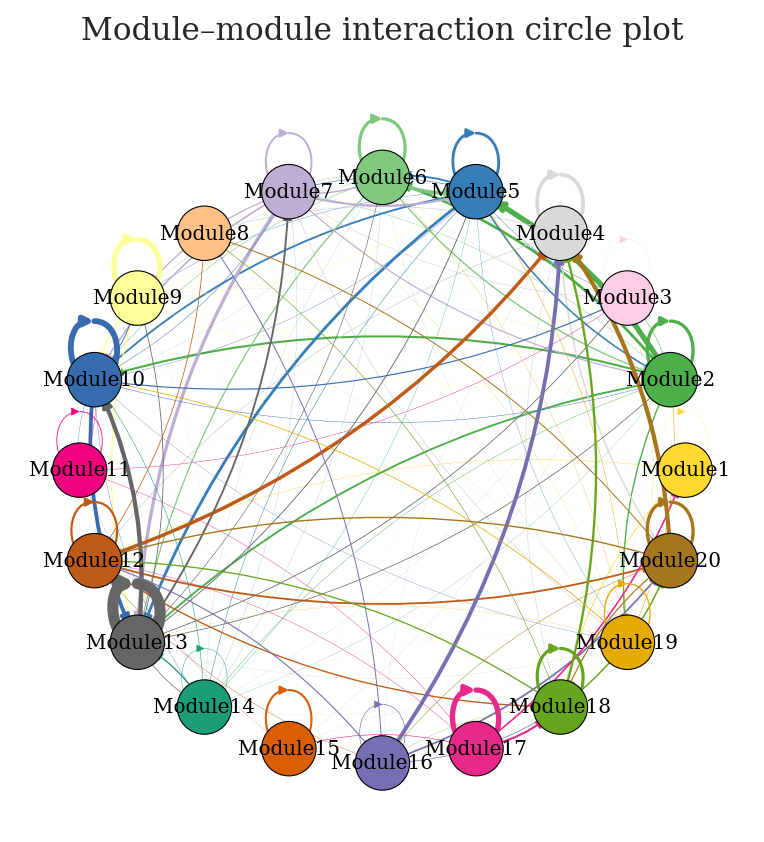

In [186]:
sigmod_plot.plot_circle_interactions(total_influence_df,node_color_map,
                                     edge_cmap="Reds",max_width=5,min_width=0,
                                     figsize = (5,5.5),
                                     file_name="Figures/9_1_TotalInteraction.pdf")

In [187]:
PDCD1LG2_PDCD1 = pd.DataFrame(Influence[13],
                              columns = ["Module"+str(i+1) for i in range(20)],
                              index = ["Module"+str(i+1) for i in range(20)])

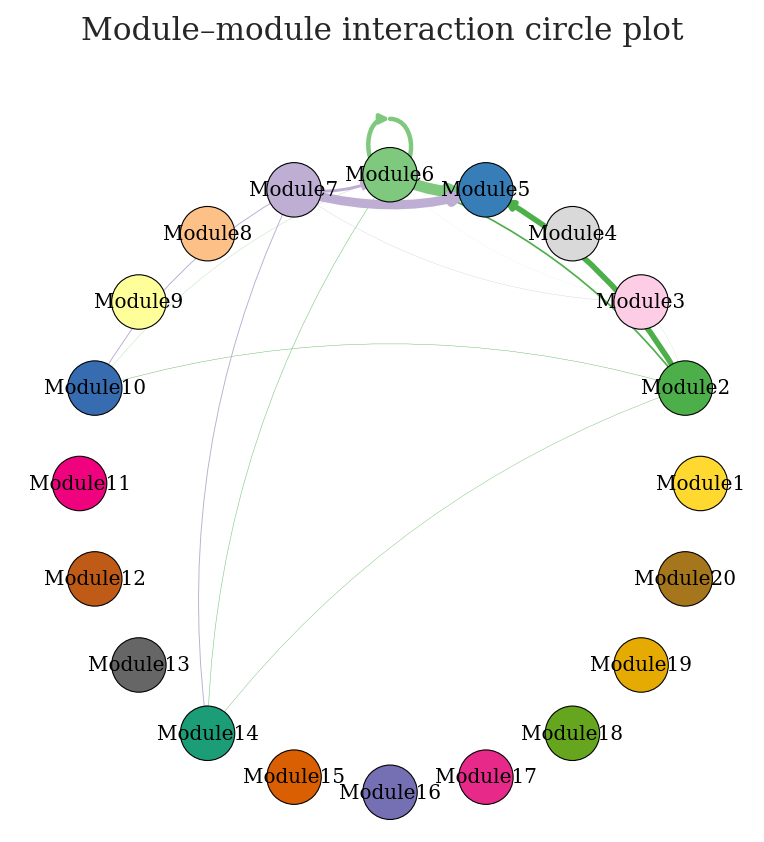

In [188]:
sigmod_plot.plot_circle_interactions(PDCD1LG2_PDCD1,node_color_map,
                                     edge_cmap="Reds",max_width=5,min_width=0,
                                     figsize = (5,5.5),
                                     file_name="Figures/9_2_PDCD1LG2_PDCD1.pdf")

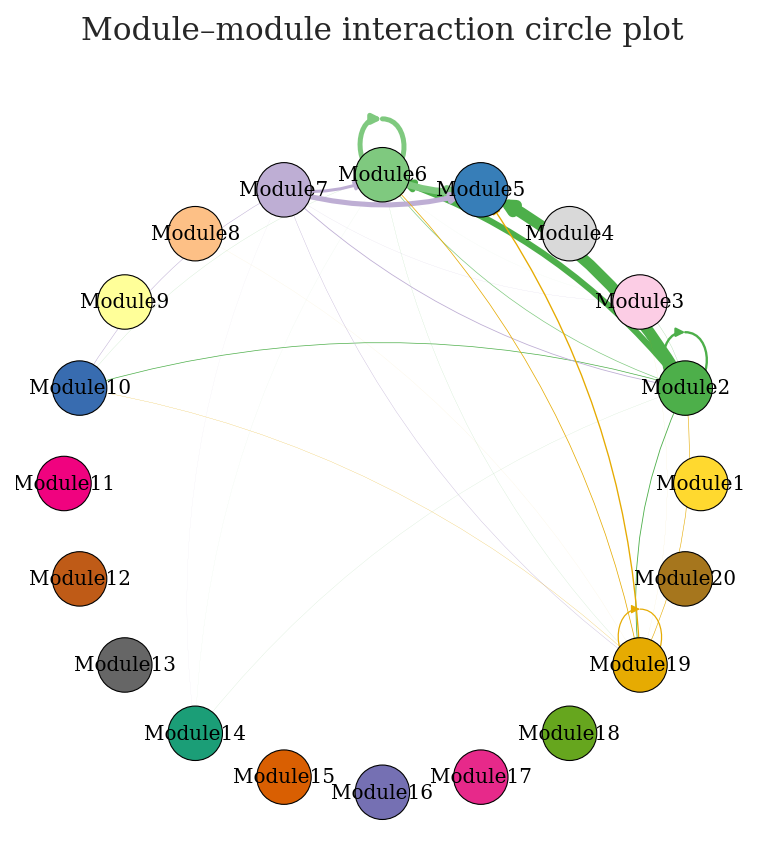

In [190]:
CD86_CTLA4 = pd.DataFrame(Influence[12],
                              columns = ["Module"+str(i+1) for i in range(20)],
                              index = ["Module"+str(i+1) for i in range(20)])
sigmod_plot.plot_circle_interactions(CD86_CTLA4,node_color_map,
                                     edge_cmap="Reds",max_width=5,min_width=0,
                                     figsize = (5,5.5),
                                     file_name="Figures/9_3_CD86_CTLA4.pdf")

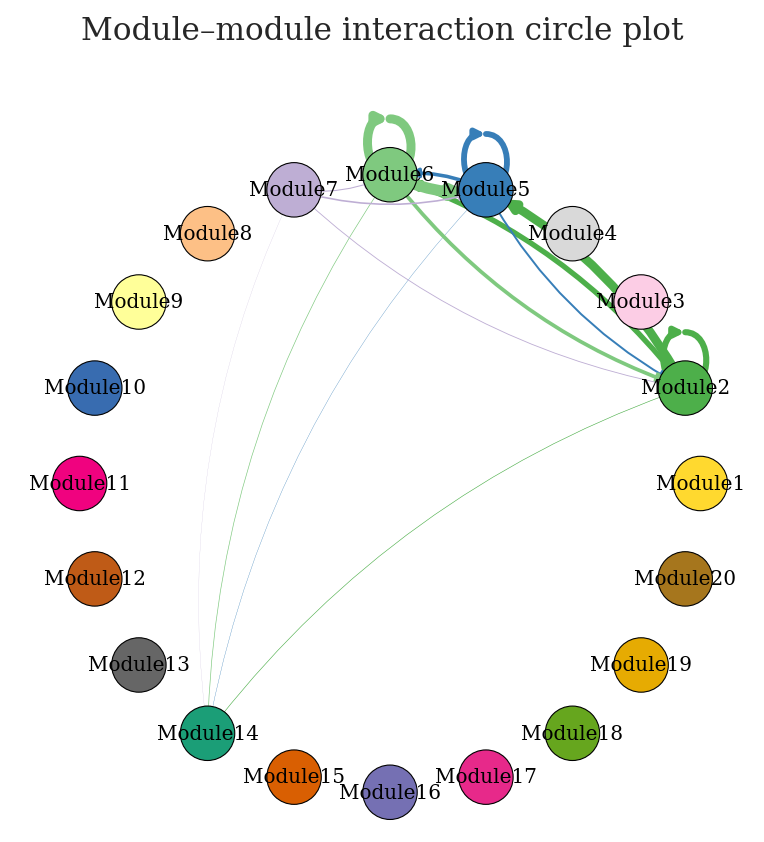

In [192]:
CD274_PDCD1 = pd.DataFrame(Influence[14],
                              columns = ["Module"+str(i+1) for i in range(20)],
                              index = ["Module"+str(i+1) for i in range(20)])
sigmod_plot.plot_circle_interactions(CD274_PDCD1,node_color_map,
                                     edge_cmap="Reds",max_width=5,min_width=0,
                                     figsize = (5,5.5),
                                     file_name="Figures/9_3_CD274_PDCD1.pdf")

In [53]:
for idx, influence_element in enumerate(Influence):
    print(eta.index[idx])  # Optional: to track progress
    
    # Create a DataFrame for the current element
    current_df = pd.DataFrame(influence_element,
                              columns=["Topic"+str(i+1) for i in range(20)],
                              index=["Topic"+str(i+1) for i in range(20)])
    current_df.to_csv("./Data/" + eta.index[idx] + "_influence_df.csv")

CEACAM6_EGFR
MMP2_PECAM1
CDH1_EGFR
CXCL12_CXCR4
CXCL12_CD4
S100A8_CD69
C1QA_CD93
S100A8_CD68
CD274_CD80
S100A4_ERBB2
S100A4_EGFR
CXCL12_AVPR1A
CD86_CTLA4
PDCD1LG2_PDCD1
CD274_PDCD1
CXCL12_SDC4
CCL5_SDC4
EDN1_EDNRB


CEACAM6_EGFR


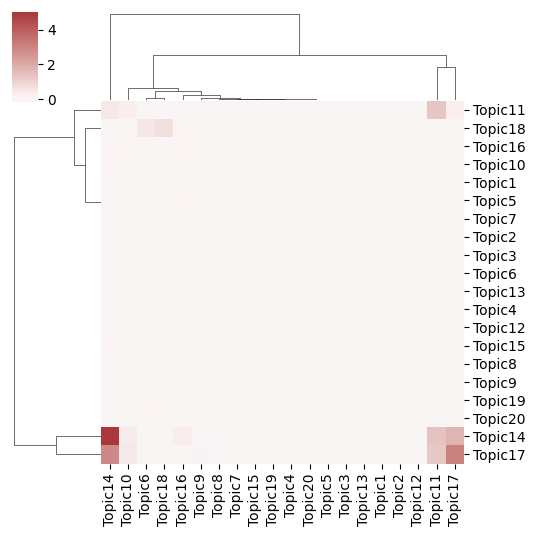

MMP2_PECAM1


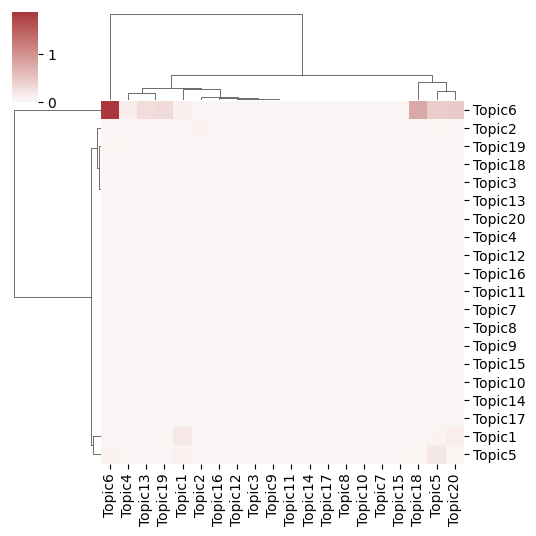

CDH1_EGFR


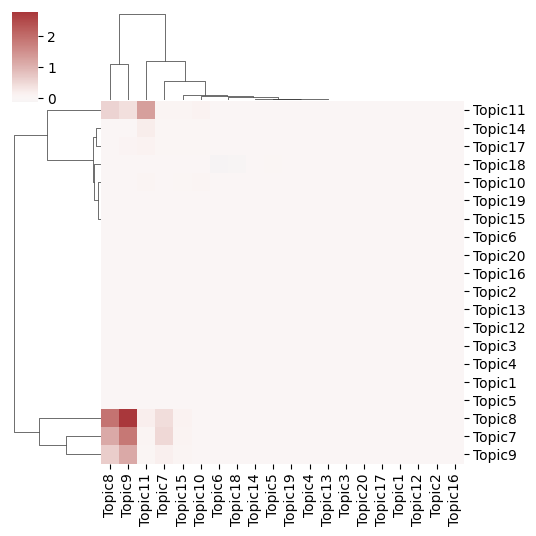

CXCL12_CXCR4


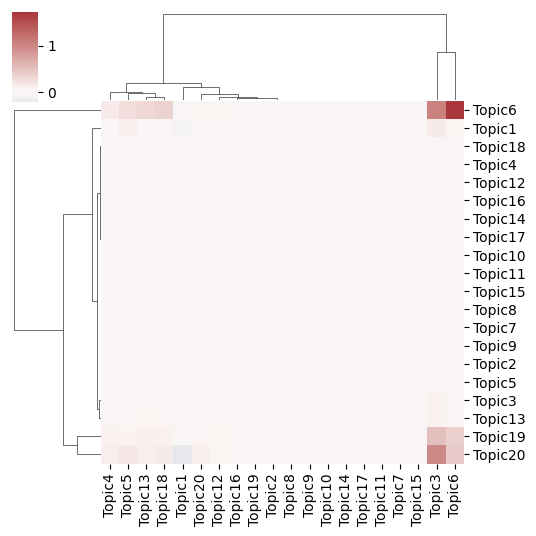

CXCL12_CD4


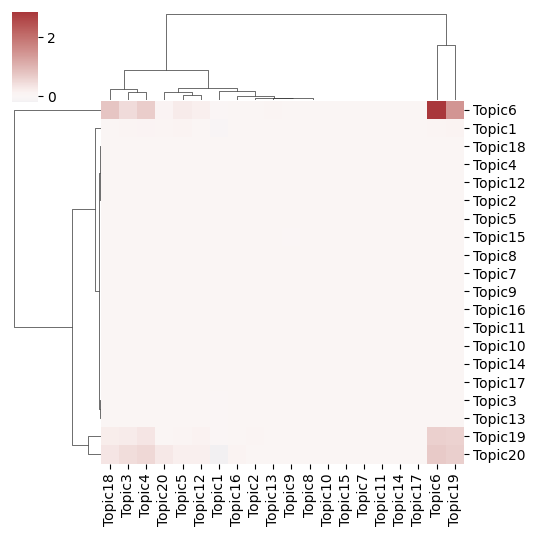

S100A8_CD69


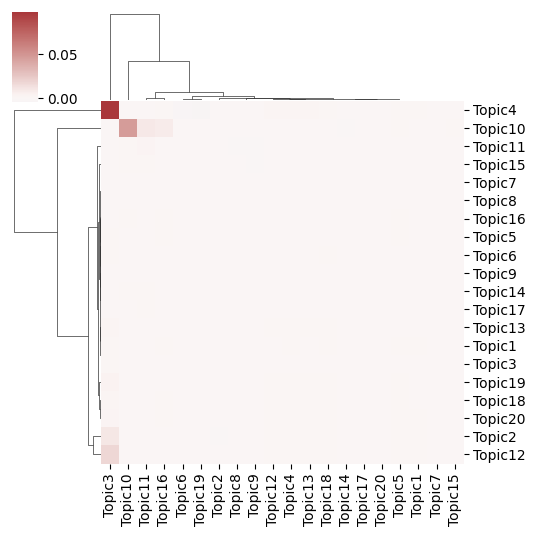

C1QA_CD93


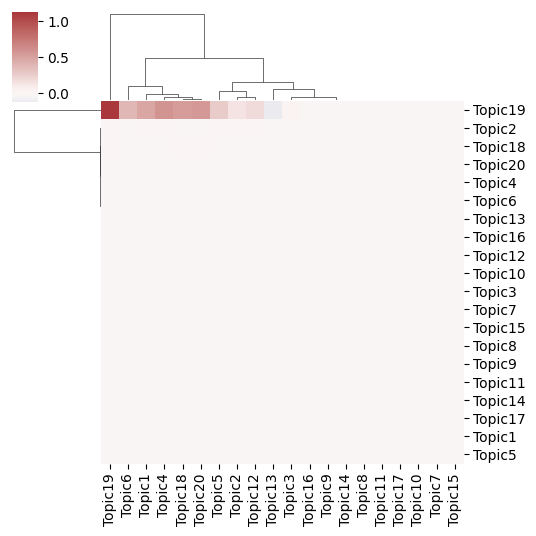

S100A8_CD68


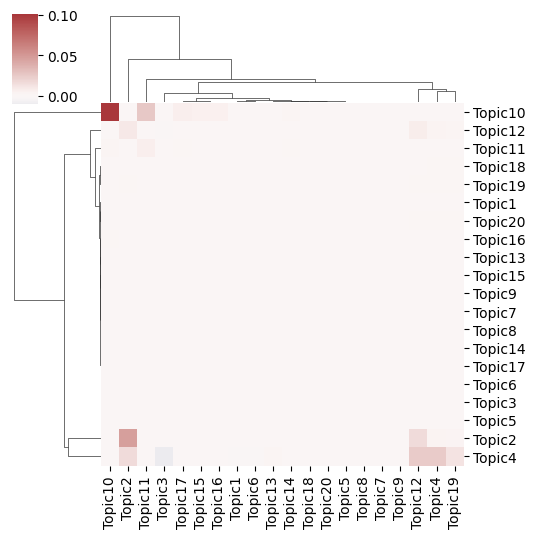

CD274_CD80


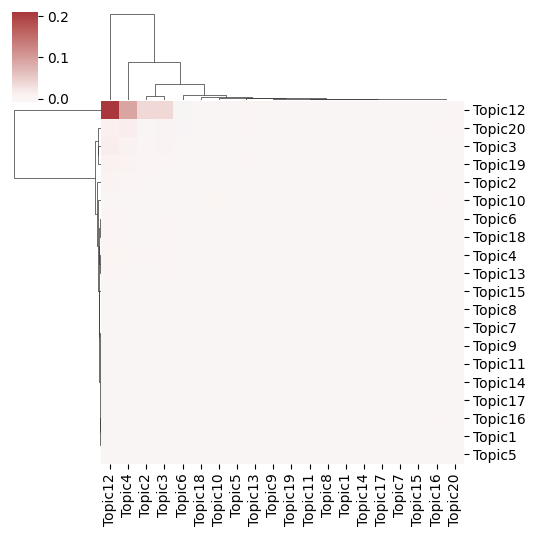

S100A4_ERBB2


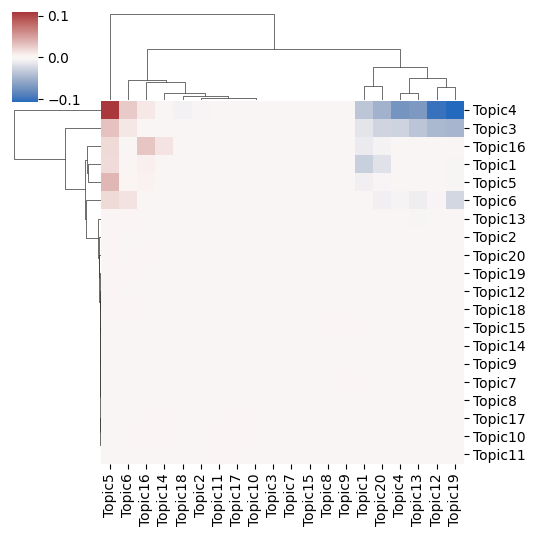

S100A4_EGFR


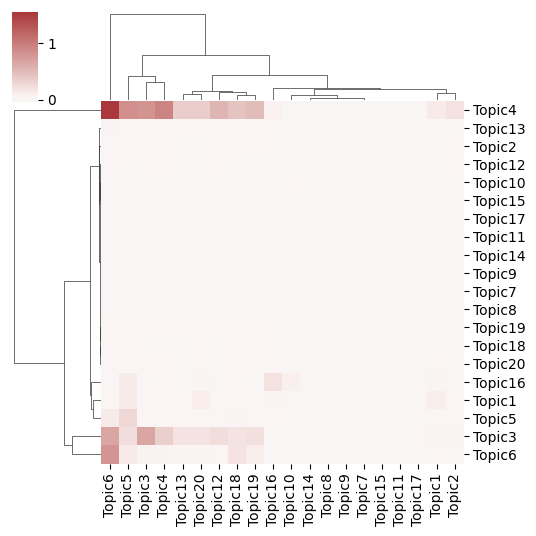

CXCL12_AVPR1A


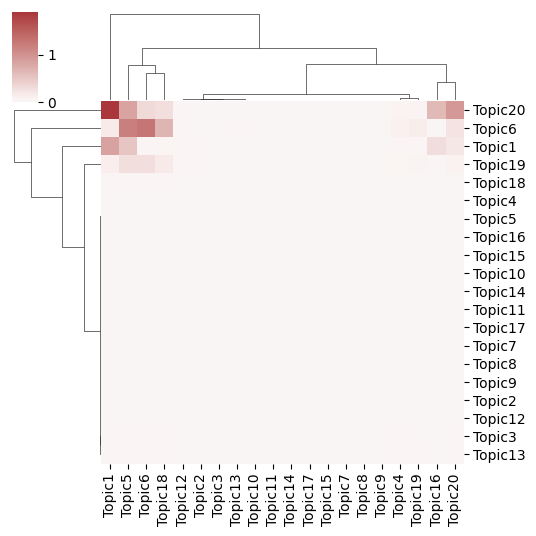

CD86_CTLA4


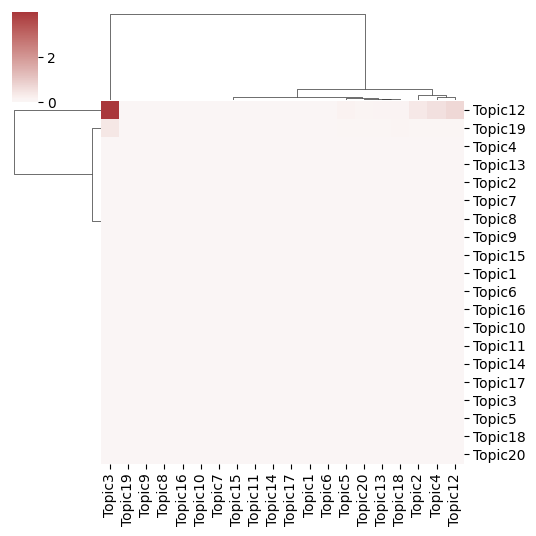

PDCD1LG2_PDCD1


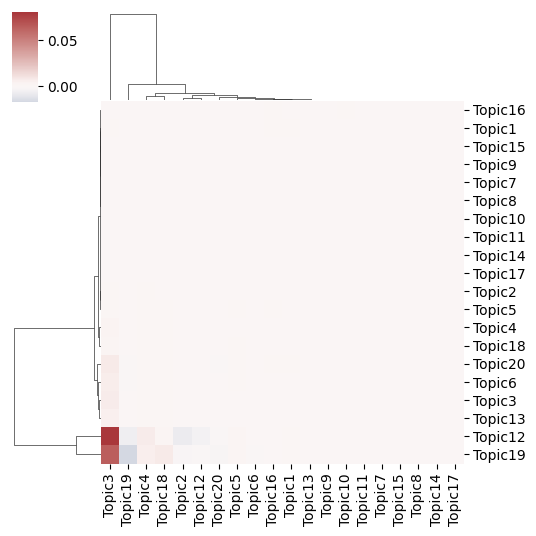

CD274_PDCD1


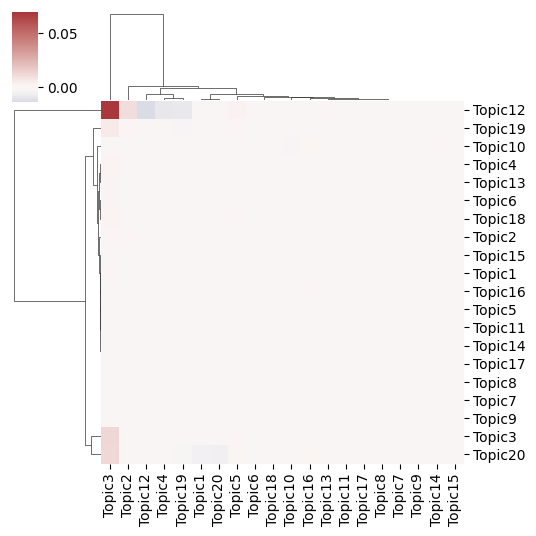

CXCL12_SDC4


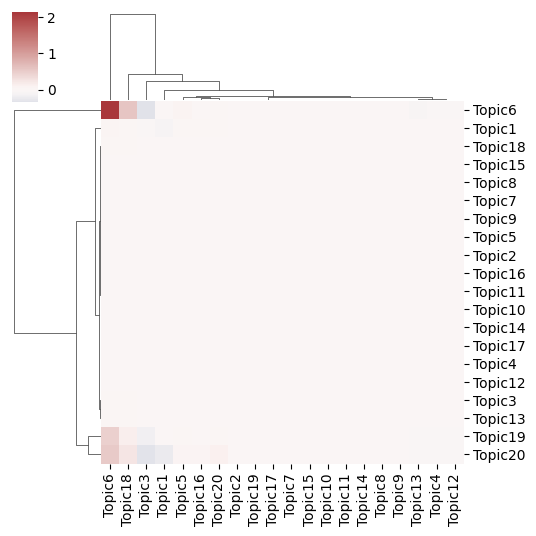

CCL5_SDC4


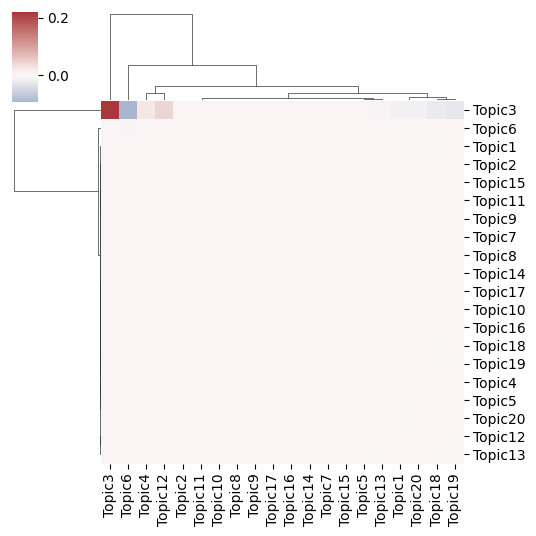

EDN1_EDNRB


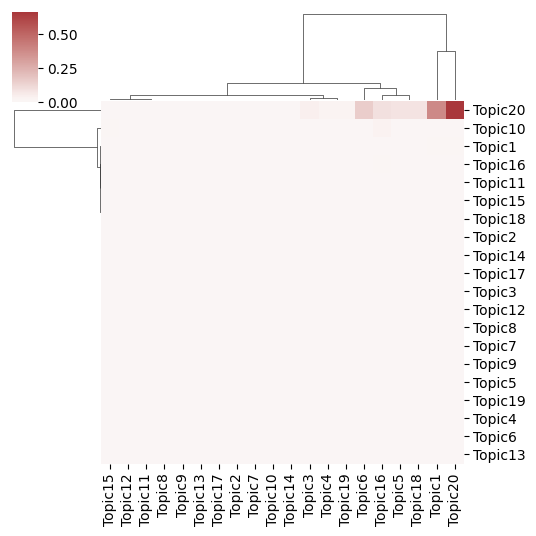

In [73]:
# Assuming Influence is a list of matrices or data structures
for idx, influence_element in enumerate(Influence):
    print(eta.index[idx])  # Optional: to track progress
    
    # Create a DataFrame for the current element
    current_df = pd.DataFrame(influence_element,
                              columns=["Topic"+str(i+1) for i in range(20)],
                              index=["Topic"+str(i+1) for i in range(20)])
    
    # Generate the clustermap
    g = sns.clustermap(current_df,
                       col_cluster=True, row_cluster=True,
                       cmap="vlag", center=0)
    
    # Adjust the figure size
    g.fig.set_size_inches(5, 5)
    
    # Display the plot
    plt.show()


In [51]:
total_influence = Influence.sum(axis=0)
total_influence_df = pd.DataFrame(total_influence,
                              columns = ["Topic"+str(i+1) for i in range(20)],
                              index = ["Topic"+str(i+1) for i in range(20)])
total_influence_df.to_csv("./Data/total_influence_df.csv")

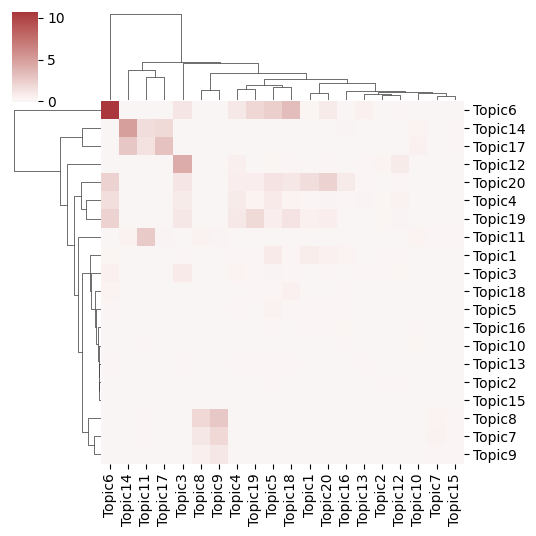

In [52]:
g = sns.clustermap(total_influence_df,
                   col_cluster=True,row_cluster=True,
                   cmap="vlag", center=0,
                   z_score=None)
g.fig.set_size_inches(5, 5)
plt.show()